# Using Pandas Profiling to Accelerate Our Exploratory Analysis

Pandas Profiling is a library that generates reports from a pandas DataFrame. The pandas `df.describe()` function that we normally use in Pandas is great but it is a bit basic for a more serious and detailed exploratory data analysis. `pandas_profiling` extends the pandas DataFrame with `df.profile_report()` for a quick data analysis.

The following statistics for each column are presented in an interactive report.

* **Type information**: detect the types of columns in a dataframe.
* **Essentials**: type, single values, missing values
* **Quantile statistics** as minimum value, Q1, median, Q3, maximum, range, interquartile range
* **Descriptive statistics** such as mean, mode, standard deviation, sum, median absolute deviation, coefficient of variation, kurtosis, asymmetry
* **The most frequent values**
* **Histograms**
* **Outstanding correlations** of highly correlated variables, Spearman, Pearson and Kendall matrices
* **Lost Value Matrix**, Count, Heat Map and Lost Value Dendrogram
* **Text Analysis** learns about categories (Shift, Space), hyphens (Latin, Cyrillic) and blocks (ASCII) of text data.
* **File and image analysi**s extracts file sizes, creation dates, and dimensions and scans images that are truncated or contain EXIF information.

For this Notebook you'll find the dataset once <a href="https://www.narrativetext.co/pricing" target="_blank">you subscribe to our service here</a> 

This comprehensive data set from the Meteorological Society contains information on all known meteorite landings. It is interesting to observe the places on earth where these objects have fallen, following the coordinates of the dataset.

Meteorite fall map

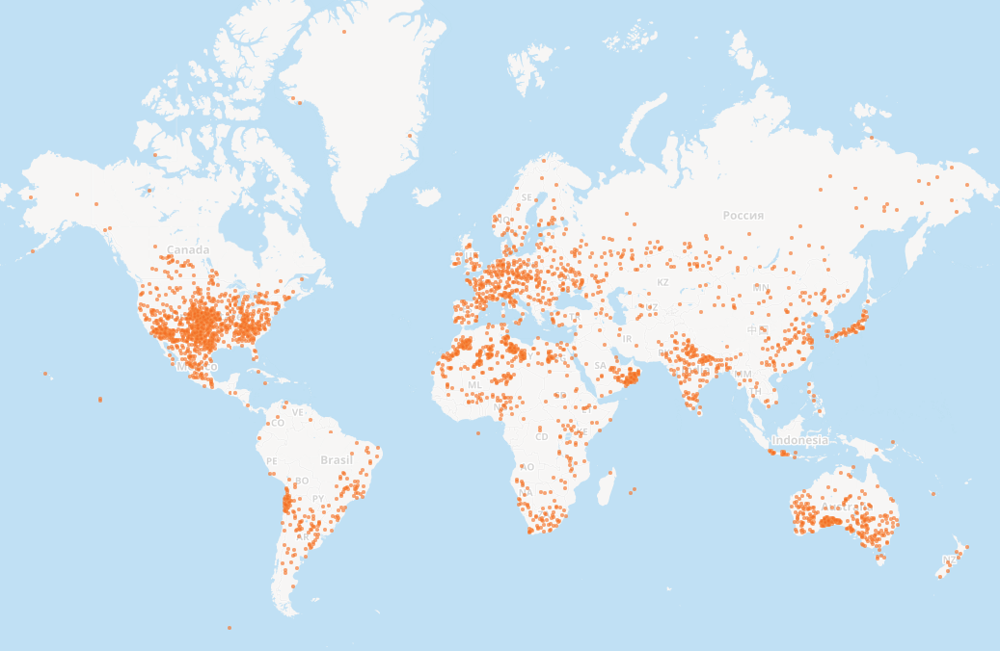

Let's start now by importing the dataset, in order to understand a little bit the data we will work with

In [1]:
import pandas as pd

We have saved the dataset in the 'datasets' folder of the present working environment, so we selected the right path for the import

In [2]:
df = pd.read_csv("datasets/Meteorite_Landings.csv")

And now we check the data

In [4]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)"
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)"
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)"
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)"
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)"


In [5]:
df.shape

(45716, 10)

It is a very interesting dataset, where we can observe the name that the scientists gave to the meteorite, the type of class `recclass`, the weight in grams `mass (g)` the date in which it fell and the coordinates in which it fell. 

It is also important to note that this is a very complete dataset, with 45,716 records and 10 columns. This information is given by the `.shape`

Now, as we mentioned at the beginning, with Pandas we have gotten used to running the `.describe()` command to generate a descriptive analysis on the dataset in question. Descriptive statistics include those that summarize the central tendency, dispersion, and form of distribution of a data set, excluding the `NaN` values.

It analyzes both numerical and object series, as well as DataFrame column sets of mixed data types. The result will vary depending on what is provided. For more information about `.describe()` and the parameters we can pass, you can find the info here: <a href="https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.describe.html" target="blank">Pandas describe</a>

Now let's run this command over our dataset and see the result

In [6]:
df.describe()

,id,mass (g),reclat,reclong
count,45716.000000,4.558500e+04,38401.000000,38401.000000
mean,26889.735104,1.327808e+04,-39.122580,61.074319
std,16860.683030,5.749889e+05,46.378511,80.647298
min,1.000000,0.000000e+00,-87.366670,-165.433330
25%,12688.750000,7.200000e+00,-76.714240,0.000000
50%,24261.500000,3.260000e+01,-71.500000,35.666670
75%,40656.750000,2.026000e+02,0.000000,157.166670
max,57458.000000,6.000000e+07,81.166670,354.473330


The describe() method skips over the categorical columns (string type) and makes a descriptive statistical analysis on the numerical columns. Here we could see that the `id` column might not be useful for this analysis, since it is only a single indicator for each row (primary key of the table), while the `mass` is useful and interesting to understand, for example, the minimum and maximum value, the mean and the percentiles (25, 50, 75). 

As we can see, this is a very basic analysis, without further relevant information. If we want more relevant information we must start writing code. 

This is where Pandas profiling comes in, and its usefulness. The documentation of this library can be found in the following link. <a href="https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/" target="blank">Pandas profiling</a>. The installation will be done in the following way

## Installing and importing Pandas Profiling

In [7]:
!pip3 install 'pandas-profiling[notebook,html]'

You should consider upgrading via the '/home/daniel/Desktop/narrativetext_project/notebooks/bin/python -m pip install --upgrade pip' command.


It is mandatory to pass between quotes the command and followed by `notebook,html` this is because we will need these two functions of the library. 

If you are using Conda, these are the other ways to install it: <a href="https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/pages/installation.html" target="blank">Installing Pandas profiling</a>

## Creating relevant columns to the analysis

Now we are going to create a series of columns that will be relevant to the analysis that we will do with Pandas Profiling, the first one will be to create a constant variable for all the records, this time we will say that all the records belong to NASA, and we do the following

In [8]:
df['source'] = "NASA"

In [9]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA


As we can see, this column was eventually created. We are now going to create a boolean variable at random, simulating some kind of boolean output for each record. 

Remember that this is done so that our exploratory analysis can identify this type of data in the result. 

In [11]:
# we imported numpy, it should have been installed with Pandas. If you don't have it, you can do it with 
# the `pip3 install numpy` command

import numpy as np

In [12]:
# numpy is going to help us create those random booleans in the next line of code

df['boolean'] = np.random.choice([True, False], df.shape[0])

In [13]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA,False
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA,False
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA,True
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA,False
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA,False


As we see, the column `boolean` was created with random values of `True` or `False` for each of the rows of our dataset, this is thanks to the `df.shape[0]` that refers to the rows or records of the dataset, that is to say that it made this operation 45,716 times, which is the total number of records. 

Also read: <a href="https://www.narrativetext.co/data-hub/how-to-use-python-datetimes-correctly" target="_blank">How to Use Python Datetimes Correctly?</a>

Let's do now something similar, but mixing numerical data types and categorical data types (strings)

In [14]:
df['mixed'] = np.random.choice([1, 'A'], df.shape[0])

In [15]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean,mixed
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA,False,A
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA,False,1
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA,True,A
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA,False,1
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA,False,1


As we can see, here we are simulating that a column has two types of data mixed together, both numerical and categorical. This is something that we can find in real datasets, and `describe()` of Pandas will simply ignore them, and will not give us any analysis about that column (remember that `describe()` only gives results about numerical columns, it even ignores the boolean columns too)

Now let's do something even more interesting. We are going to create a new column by simulating a high correlation with an existing column. In particular, we will do it on the column `reclat` that talks about the latitude where the meteorite has fallen, and we will add a normal distribution with a standard deviation of `5` and a sample size equal to the dataset longitude.

If you want to see how to create a simulation of a normal distribution with random numbers with Numpy, check this link. <a href="https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html" target="blank">Random normal numpy</a> 

In [16]:
df['reclat_city'] = df['reclat'] + np.random.normal(scale=5, size=(len(df)))

In [17]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean,mixed,reclat_city
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA,False,A,45.108012
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA,False,1,44.845134
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA,True,A,56.421836
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA,False,1,20.536132
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA,False,1,-24.426722


Let's check the result of the last command, we can see that this column `reclat_city` now has a high correlation with `reclat`, because when one observation or row is positive the other one too, and when one is negative, the other one too. 

To analyze correlations with Pandas we use a different method than `describe()`, in this case we use the `corr()` command. However, with Pandas profiling both analyses (descriptive statistics and correlations) we will obtain them with only one command. We will see this in a few moments when we run our exploratory analysis. 

Remember that for now what we are doing is adding columns to the dataframe in order to see all the possibilities offered by the Pandas profiling tool. 

We are now going to simulate another common scenario in the datasets, and that is to have duplicate observations or rows. This we will do it like this:

In [18]:
duplicates_to_add = pd.DataFrame(df.iloc[0:10])

In [19]:
duplicates_to_add

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean,mixed,reclat_city
0,Aachen,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA,False,A,45.108012
1,Aarhus,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA,False,1,44.845134
2,Abee,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA,True,A,56.421836
3,Acapulco,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA,False,1,20.536132
4,Achiras,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA,False,1,-24.426722
5,Adhi Kot,379,Valid,EH4,4239.0,Fell,01/01/1919 12:00:00 AM,32.10000,71.80000,"(32.1, 71.8)",NASA,False,A,35.951071
6,Adzhi-Bogdo (stone),390,Valid,LL3-6,910.0,Fell,01/01/1949 12:00:00 AM,44.83333,95.16667,"(44.83333, 95.16667)",NASA,True,A,48.626966
7,Agen,392,Valid,H5,30000.0,Fell,01/01/1814 12:00:00 AM,44.21667,0.61667,"(44.21667, 0.61667)",NASA,False,1,43.906622
8,Aguada,398,Valid,L6,1620.0,Fell,01/01/1930 12:00:00 AM,-31.60000,-65.23333,"(-31.6, -65.23333)",NASA,True,A,-33.367825
9,Aguila Blanca,417,Valid,L,1440.0,Fell,01/01/1920 12:00:00 AM,-30.86667,-64.55000,"(-30.86667, -64.55)",NASA,True,A,-18.912785


What we just did was to create a new dataframe from the first 10 rows of our original dataframe. To do this we use an `iloc` that serves to select rows and a slice selector to select from row 0 to row 10-1. 

Now let's change the name to identify them later, but the other values remain the same

In [20]:
duplicates_to_add['name'] = duplicates_to_add['name'] + " copy"

In [21]:
duplicates_to_add

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean,mixed,reclat_city
0,Aachen copy,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA,False,A,45.108012
1,Aarhus copy,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA,False,1,44.845134
2,Abee copy,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA,True,A,56.421836
3,Acapulco copy,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA,False,1,20.536132
4,Achiras copy,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA,False,1,-24.426722
5,Adhi Kot copy,379,Valid,EH4,4239.0,Fell,01/01/1919 12:00:00 AM,32.10000,71.80000,"(32.1, 71.8)",NASA,False,A,35.951071
6,Adzhi-Bogdo (stone) copy,390,Valid,LL3-6,910.0,Fell,01/01/1949 12:00:00 AM,44.83333,95.16667,"(44.83333, 95.16667)",NASA,True,A,48.626966
7,Agen copy,392,Valid,H5,30000.0,Fell,01/01/1814 12:00:00 AM,44.21667,0.61667,"(44.21667, 0.61667)",NASA,False,1,43.906622
8,Aguada copy,398,Valid,L6,1620.0,Fell,01/01/1930 12:00:00 AM,-31.60000,-65.23333,"(-31.6, -65.23333)",NASA,True,A,-33.367825
9,Aguila Blanca copy,417,Valid,L,1440.0,Fell,01/01/1920 12:00:00 AM,-30.86667,-64.55000,"(-30.86667, -64.55)",NASA,True,A,-18.912785


If we look, now all the names have the word 'copy' at the end. We already have this new dataset ready to concatenate it to the original dataset, so we can have duplicated data. Let's do now the `append`

In [22]:
df = df.append(duplicates_to_add, ignore_index=True)

In [23]:
df.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean,mixed,reclat_city
0,Aachen copy,1,Valid,L5,21.0,Fell,01/01/1880 12:00:00 AM,50.77500,6.08333,"(50.775, 6.08333)",NASA,False,A,45.108012
1,Aarhus copy,2,Valid,H6,720.0,Fell,01/01/1951 12:00:00 AM,56.18333,10.23333,"(56.18333, 10.23333)",NASA,False,1,44.845134
2,Abee copy,6,Valid,EH4,107000.0,Fell,01/01/1952 12:00:00 AM,54.21667,-113.00000,"(54.21667, -113.0)",NASA,True,A,56.421836
3,Acapulco copy,10,Valid,Acapulcoite,1914.0,Fell,01/01/1976 12:00:00 AM,16.88333,-99.90000,"(16.88333, -99.9)",NASA,False,1,20.536132
4,Achiras copy,370,Valid,L6,780.0,Fell,01/01/1902 12:00:00 AM,-33.16667,-64.95000,"(-33.16667, -64.95)",NASA,False,1,-24.426722


In [24]:
df.shape

(45726, 14)

The original dataset contains 45716 rows, now we have 10 more rows, which are the duplicate rows. In fact we can see some of them in the above display!

## Using Pandas profiling

Now we have arrived at the expected moment, we have added some columns to the dataset that will allow us to see interesting analyses on it. But before that, we must be fair to the pandas `describe()` and see what analysis it gives us on the resulting dataset

In [25]:
df.describe()

,id,mass (g),reclat,reclong,reclat_city
count,45726.000000,4.559500e+04,38411.000000,38411.000000,38411.000000
mean,26883.906202,1.327843e+04,-39.107095,61.052594,-39.086822
std,16863.445566,5.749260e+05,46.386011,80.655258,46.606354
min,1.000000,0.000000e+00,-87.366670,-165.433330,-104.333501
25%,12681.250000,7.200000e+00,-76.713770,0.000000,-78.167480
50%,24256.500000,3.261000e+01,-71.500000,35.666670,-68.929999
75%,40653.500000,2.029000e+02,0.000000,157.166670,4.711421
max,57458.000000,6.000000e+07,81.166670,354.473330,80.190247


As we see, very little difference, it does not give us additional information about:
* Boolean columns
* Mixed columns
* Correlations

Also read: <a href="https://www.narrativetext.co/data-hub/using-predictive-power-score-to-pinpoint-non-linear-correlations" target="_blank">Using Predictive Power Score to Pinpoint Non-linear Correlations</a>

This is where Pandas profiling shines by its simplicity to perform an exploratory analysis on our datasets. Without further ado, let's run the following command

In [26]:
## we already have the library installed, now we need to import it

import pandas_profiling
from pandas_profiling.utils.cache import cache_file

In [27]:
## now we run the report

report = df.profile_report(sort='None', html={'style':{'full_width':True}})

In [28]:
report

## Understanding the results

The output speaks for itself. In comparison with Pandas `describe()` or even Pandas `corr()` it is quite significant, and from the beginning we can observe a lot of additional data and analysis that will help us to better interpret the dataset we are working with. Let's analyze for example the columns we recently added

* In the Overview we can see the duplicate rows report: `Duplicate rows 10`
* In the Type of variable we can see the Boolean column: `BOOL 1`
* In the Overview, but in the Warnings we can see the high correlation between the columns we created: `reclat_city is highly correlated with reclat	High correlation`
* We can see after the Overview an analysis of each column/variable
* In the variable `mixed` we can see the analysis of the randomly generated values
* Further down in the section `Interactions` we can see the different types of graphs and their correlations between variables.
* Then we can see an analysis of correlations, which is always important to understand the interdependence of the data and the possible predictive power that these variables have
* We can also see an analysis of the "missing values", which is always interesting to make some kind of cleaning or normalization of the data. 

Finally we might want to have this report in a different format than a Jupyter Notebook, the library offers us the possibility to export the report to `html`, which is useful to show it in a more friendly environment for the end user. In which you can even interact by means of navigation bars. 

In [29]:
report.to_file(output_file="report_eda.html")

The file in this case has remained within my work environment

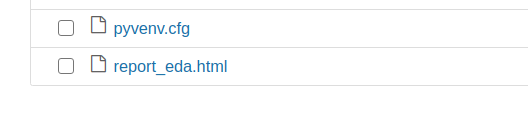

If we click on it, it will open in the browser. This format, personally I like quite a lot, since it does not influence the code, but you can navigate through the analysis and show it to the interested stackeholders in the analysis and make decisions based on them. 

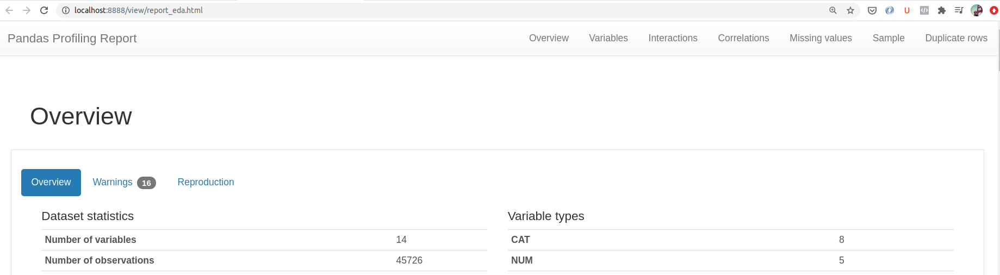

## Final Notes

As you can see, it is very easy to use the tool, and it is a first step before starting to perform feature engineering and/or predictions. However there are some disadvantages about the tool that are important to take into account:

* The main disadvantage of pandas profiling is its use with large data sets. With increasing data size, the time to generate the report also increases a lot.
* One way to solve this problem is to generate the profile report for a portion of the data set. But while doing this, it is very important to make sure that the data are sampled randomly so that they are representative of all the data we have. We can do this for example:

In [30]:
data = df.sample(n=1000)

In [31]:
data.head()

,name,id,nametype,recclass,mass (g),fall,year,reclat,reclong,GeoLocation,source,boolean,mixed,reclat_city
28503,Northwest Africa 4261,35384,Valid,L4-6,201.00,Found,01/01/2003 12:00:00 AM,NaN,NaN,NaN,NASA,True,1,NaN
39638,Yamato 790342,25691,Valid,H4,0.94,Found,01/01/1979 12:00:00 AM,-71.50000,35.66667,"(-71.5, 35.66667)",NASA,True,1,-72.684310
40111,Yamato 790870,26219,Valid,LL6,3.44,Found,01/01/1979 12:00:00 AM,-71.50000,35.66667,"(-71.5, 35.66667)",NASA,True,A,-74.082399
21649,Littlerock,14667,Valid,H6,19050.00,Found,01/01/1979 12:00:00 AM,34.51667,-117.98333,"(34.51667, -117.98333)",NASA,False,1,34.935314
21328,Lewis Cliff 88606,14344,Valid,LL6,2.70,Found,01/01/1988 12:00:00 AM,-84.27551,161.40034,"(-84.27551, 161.40034)",NASA,False,1,-81.448415


In [32]:
len(data)

1000

As we can see, 1000 samples have been selected at random, so the analysis will not be done on more than 40,000 samples. If we have, say 1,000,000 samples, the difference in performance will be significant, so this would be a good practice

In [33]:
profile_in_sample = data.profile_report(sort='None', html={'style':{'full_width':True}})

In [34]:
profile_in_sample

As we see it takes less time to run with a sample of 1,000 examples. 

* Alternatively, if you insist on getting the report of the whole data set, you can do it using the minimum mode. 
* In the minimum mode a simplified report will be generated with less information than the full one, but it can be generated relatively quickly for a large data set. 
* The code for it is given below:

In [35]:
profile_min = data.profile_report(minimal=True)

In [36]:
profile_min

As we can see, it is a faster report but with less information about the exploratory analysis of the data. We leave it up to you to decide what type of report you want to generate. If you want to see more advanced features of the library please go to the following link: <a href="https://pandas-profiling.github.io/pandas-profiling/docs/master/rtd/pages/advanced_usage.html" target="blank">Advanced Pandas profiling </a>

**We hope you liked this notebook, see you in the next one!**

Other notebooks you may be interested in:

* <a href="https://www.narrativetext.co/lady-data/creating-the-whole-machine-learning-pipeline-with-pycaret" target="_blank">Creating the Whole Machine Learning Pipeline with PyCaret</a>
* <a href="https://www.narrativetext.co/lady-data/using-python-pandas-datareader-to-analyze-financial-data" target="_blank">Using Python & Pandas Datareader to Analyze Financial Data</a>
* <a href="https://www.narrativetext.co/the-analyst/building-a-product-recommendation-system-with-collaborative-filtering" target="_blank">Building a Product Recommendation System with Collaborative Filtering</a>